In [44]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

In [45]:
df = pd.read_csv("Data.csv")

In [46]:
df.head()

,date,area,average_price,code,houses_sold,no_of_crimes
0,1/1/1995,city of london,91449,E09000001,17.0,NaN
1,2/1/1995,city of london,82203,E09000001,7.0,NaN
2,3/1/1995,city of london,79121,E09000001,14.0,NaN
3,4/1/1995,city of london,77101,E09000001,7.0,NaN
4,5/1/1995,city of london,84409,E09000001,10.0,NaN


In [47]:
df.count()

date             13549
area             13549
average_price    13549
code             13549
houses_sold      13455
no_of_crimes      7439
dtype: int64

In [48]:
# df.isnull() # True = null values
df.isnull().sum() # Count of nulls in each column

date                0
area                0
average_price       0
code                0
houses_sold        94
no_of_crimes     6110
dtype: int64

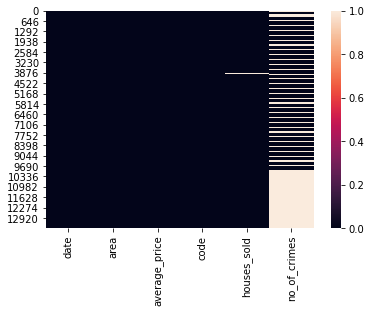

In [49]:
sns.heatmap(df.isnull())
plt.show() # Graph to show null values in each column 

In [50]:
df.dtypes # Analyse all data types

date              object
area              object
average_price      int64
code              object
houses_sold      float64
no_of_crimes     float64
dtype: object

In [51]:
df = df.dropna(how='any',axis=0) # Gets rid of all ('any') null values in all rows (axis=0)

In [52]:
df['date'] = pd.to_datetime(df['date']) # Change datatype of date column

In [53]:
df.dtypes

date             datetime64[ns]
area                     object
average_price             int64
code                     object
houses_sold             float64
no_of_crimes            float64
dtype: object

In [54]:
df['year'] = df['date'].dt.year # Make a new column called 'year' with only year values
df.insert(1, 'month', df['date'].dt.month) # Add new column after 1st column called 'month'
df.head()

,date,month,area,average_price,code,houses_sold,no_of_crimes,year
72,2001-01-01,1,city of london,284262,E09000001,24.0,0.0,2001
73,2001-02-01,2,city of london,198137,E09000001,37.0,0.0,2001
74,2001-03-01,3,city of london,189033,E09000001,44.0,0.0,2001
75,2001-04-01,4,city of london,205494,E09000001,38.0,0.0,2001
76,2001-05-01,5,city of london,223459,E09000001,30.0,0.0,2001


In [55]:
del df['month'] # Use del to delete a column
del df['year']

In [56]:
len(df[df['no_of_crimes'] == 0]) # Gets number of record with 0 num of crimes

104

In [57]:
df['year'] = df['date'].dt.year

In [58]:
df1 = df[df['area'] == 'england'] # Makes a new df with only data thats area == england

# Get the min/max/mean average price by year 
# df1.groupby('year').average_price.max()
# df1.groupby('year').average_price.max()
df1.groupby('year').average_price.mean()


Series([], Name: average_price, dtype: int64)

In [59]:
# df.groupby('area').no_of_crimes.max() # Gets max num of crimes by area for all years
df.groupby('area').no_of_crimes.min().sort_values(ascending = True) # Get min num of crimes by area

area
city of london               0.0
kingston upon thames       692.0
richmond upon thames       700.0
sutton                     787.0
merton                     819.0
bexley                     860.0
harrow                     937.0
havering                  1130.0
barking and dagenham      1217.0
hammersmith and fulham    1323.0
kensington and chelsea    1347.0
bromley                   1441.0
hillingdon                1445.0
redbridge                 1487.0
greenwich                 1513.0
hounslow                  1529.0
haringey                  1536.0
waltham forest            1575.0
wandsworth                1582.0
enfield                   1635.0
tower hamlets             1646.0
lewisham                  1675.0
barnet                    1703.0
brent                     1850.0
hackney                   1870.0
ealing                    1871.0
islington                 1871.0
croydon                   2031.0
camden                    2079.0
newham                    2130.0
south

In [61]:
df[df['average_price'] < 10000].area.value_counts()

Series([], Name: area, dtype: int64)